# Plant Disease Classification

### 🍃About Dataset

Human society needs to increase food production by an estimated 70% by 2050 to feed an expected population size that is predicted to be over 9 billion people. Currently, infectious diseases reduce the potential yield by an average of 40% with many farmers in the developing world experiencing yield losses as high as 100%. The widespread distribution of smartphones among crop growers around the world with an expected 5 billion smartphones by 2020 offers the potential of turning the smartphone into a valuable tool for diverse communities growing food. One potential application is the development of mobile disease diagnostics through machine learning and crowdsourcing. Here we announce the release of over 50,000 expertly curated images on healthy and infected leaves of crops plants through the existing online platform PlantVillage. We describe both the data and the platform. These data are the beginning of an on-going, crowdsourcing effort to enable computer vision approaches to help solve the problem of yield losses in crop plants due to infectious diseases.

### 🍃 Proposed Solution
This notebook demonstrates a complete workflow for plant disease classification using traditional machine learning techniques and color histogram features. The process involves several key stages:

1.  **Data Acquisition:** The PlantVillage dataset is downloaded from KaggleHub.
2.  **Data Loading and Preprocessing:** Image file paths and their corresponding disease labels are extracted, and a Pandas DataFrame is created for easy management.
3.  **Exploratory Data Analysis (EDA):** The distribution of plant disease classes is analyzed and visualized to understand potential class imbalances.
4.  **Data Splitting:** The dataset is divided into training and testing sets, ensuring a stratified split to maintain class proportions.
5.  **Feature Extraction:** A custom function `extract_color_histogram` is used to compute 3D color histograms for each image, serving as the feature vectors for classification.
6.  **Model Training and Evaluation:** Three traditional machine learning models—K-Nearest Neighbors (KNN), Random Forest, and Support Vector Machine (SVM)—are trained on the extracted color features. Their performance is evaluated using accuracy and detailed classification reports.
7.  **Visualization of Results:** Confusion matrices are generated for each model to visualize their performance across different classes, and sample predictions are displayed to provide a qualitative assessment.



### **Importing Libraries**


In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import cv2
import numpy as np
import plotly.express as px
import math
import seaborn as sns
from skimage.feature import local_binary_pattern, hog
from skimage.color import rgb2gray
from tqdm.notebook import tqdm
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score

import random
random.seed(42)
np.random.seed(42)

import warnings
warnings.filterwarnings('ignore')

### **Downloading the Dataset from KaggleHub**
This cell uses the `kagglehub` library to download the PlantVillage dataset. The downloaded dataset path is then printed, which will be used for further data loading.

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("abdallahalidev/plantvillage-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/plantvillage-dataset


### **Loading Image File Paths and Labels**
This cell constructs the base directory for the dataset and then iterates through each disease folder to collect the full file paths of all images and their corresponding labels. It then prints the total number of images and labels found.

In [ ]:
base_dir = os.path.join(path, "color")

folds=os.listdir(base_dir)
print(folds)

filepaths=[]
labels=[]
for fold in folds:
    folder_path=os.path.join(base_dir,fold)
    # print(folder_path)
    imgs=os.listdir(folder_path)
    for img in imgs:
        img_path=os.path.join(folder_path,img)
        filepaths.append(img_path)
        labels.append(fold)
print("Total images:", len(filepaths))
print("Total labels:", len(labels))

['Tomato___Late_blight', 'Tomato___healthy', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Potato___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Early_blight', 'Tomato___Septoria_leaf_spot', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Strawberry___Leaf_scorch', 'Peach___healthy', 'Apple___Apple_scab', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Bacterial_spot', 'Apple___Black_rot', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Peach___Bacterial_spot', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Pepper,_bell___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Potato___Late_blight', 'Tomato___Tomato_mosaic_virus', 'Strawberry___healthy', 'Apple___healthy', 'Grape___Black_rot', 'Potato___Early_blight', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Common_rust_', 'Grape___Esca_(Black_Measles)', 'Raspberry___healthy', 'Tomato___Leaf_Mold', 'Tomato__

### **Creating a Pandas DataFrame**
This cell creates a pandas DataFrame from the collected `filepaths` and `labels`. This DataFrame (`data`) will be used for easier manipulation and analysis of the dataset.

In [ ]:
data_df=pd.Series(filepaths,name='filepaths')
label_df=pd.Series(labels,name='labels')
data=pd.concat([data_df,label_df],axis=1)

### **Analyzing Class Distribution**
This cell displays the count of images for each plant disease class in the dataset, providing an overview of the class distribution. This helps in understanding potential class imbalances.

In [ ]:
data.labels.value_counts()

labels
Orange___Haunglongbing_(Citrus_greening)              5507
Tomato___Tomato_Yellow_Leaf_Curl_Virus                5357
Soybean___healthy                                     5090
Peach___Bacterial_spot                                2297
Tomato___Bacterial_spot                               2127
Tomato___Late_blight                                  1909
Squash___Powdery_mildew                               1835
Tomato___Septoria_leaf_spot                           1771
Tomato___Spider_mites Two-spotted_spider_mite         1676
Apple___healthy                                       1645
Tomato___healthy                                      1591
Blueberry___healthy                                   1502
Pepper,_bell___healthy                                1478
Tomato___Target_Spot                                  1404
Grape___Esca_(Black_Measles)                          1383
Corn_(maize)___Common_rust_                           1192
Grape___Black_rot                                

### **Visualizing Class Distribution**
This cell generates an interactive bar chart using `plotly.express` to visualize the distribution of different plant disease classes. The chart provides a clear representation of how many images are available for each label.

In [ ]:
label_counts = data.labels.value_counts().reset_index()
label_counts.columns = ['Label', 'Count']

fig = px.bar(label_counts,x='Label',y='Count',color='Count',color_continuous_scale='Greens',title='🌿 Class Distribution in PlantVillage Dataset',)

fig.update_layout(
    xaxis_title="Plant Disease Classes",
    yaxis_title="Number of Images",xaxis_tickangle=-45,title_font=dict(size=22, color='#1b5e20', family='Arial'),plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',)

fig.show()

### **Displaying Sample Images**
This cell displays a grid of 6 random sample images from the dataset, along with their respective labels. This helps in visually inspecting the diversity and quality of the images.

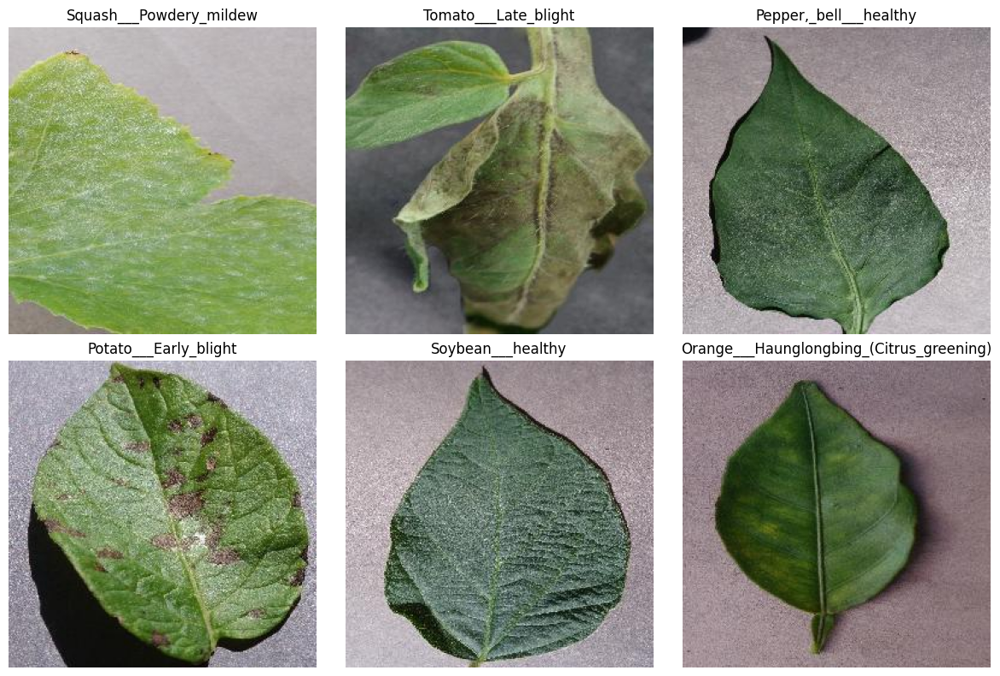

In [ ]:
plt.figure(figsize=(12,8))
for i in range(6):
    plt.subplot(2,3,i+1)
    rand_idx = np.random.randint(0, len(data))
    img_path = data.iloc[rand_idx]['filepaths']
    lbl = data.iloc[rand_idx]['labels']
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.title(lbl)
    plt.axis('off')

plt.tight_layout()
plt.show()

### **Splitting Data into Training and Testing Sets**
This cell splits the `data` DataFrame into training and testing sets using `train_test_split`. A `test_size` of 0.2 (20%) is used, and `stratify=data['labels']` ensures that the class distribution is maintained proportionally in both sets, which is crucial for imbalanced datasets. The `random_state` is set for reproducibility.

In [ ]:
train_df, test_df = train_test_split(data, test_size=0.2, shuffle=True, random_state=42, stratify=data['labels'])

print(f"Number of images in Training set: {len(train_df)}")
print(f"Number of images in Testing set: {len(test_df)}")

Number of images in Training set: 43444
Number of images in Testing set: 10861


### **Color Feature Extraction Function**

- The extract_color_histogram function serves to convert an image into a quantitative feature vector based on its color distribution.'


> This cell defines a function `extract_color_histogram` that takes an image file path, reads the image using `cv2`, resizes it, and then calculates a 3D color histogram (for B, G, R channels). The histogram is then normalized and flattened to be used as a feature vector.


In [ ]:
# Color Features (Color Histogram)
def extract_color_histogram(filepath, bins=(8, 8, 8)):
    image = cv2.imread(filepath)
    if image is None:
        return None
    resized_image = cv2.resize(image, (128, 128))
    hist = cv2.calcHist([image], [0, 1, 2], None, bins, [0, 256, 0, 256, 0, 256])
    # Normalize and flatten
    hist = cv2.normalize(hist, hist).flatten()
    return hist

### **Applying Feature Extraction**
This cell applies the `extract_color_histogram` function to both the training (`train_df`) and testing (`test_df`) datasets. It iterates through each row, extracts features, and stores them in `X_train` and `X_test`, with corresponding labels in `y_train` and `y_test`. Progress is tracked using `tqdm`.

In [ ]:
# Apply feature extraction on the Training set (extract_color_histogram)
X_train = []
y_train = []

print("Extracting features for the Training set...")
for index, row in tqdm(train_df.iterrows(), total=len(train_df)):
    features = extract_color_histogram(row['filepaths'])
    if features is not None:
        X_train.append(features)
        y_train.append(row['labels'])

X_train = np.array(X_train)
y_train = np.array(y_train)


# Apply feature extraction on the Testing set
X_test = []
y_test = []

print("\nExtracting features for the Testing set...")
for index, row in tqdm(test_df.iterrows(), total=len(test_df)):
    features = extract_color_histogram(row['filepaths'])
    if features is not None:
        X_test.append(features)
        y_test.append(row['labels'])

X_test = np.array(X_test)
y_test = np.array(y_test)

print(f"\nShape of Training Features (X_train): {X_train.shape}")
print(f"Shape of Testing Features (X_test): {X_test.shape}")

Extracting features for the Training set...


  0%|          | 0/43444 [00:00<?, ?it/s]


Extracting features for the Testing set...


  0%|          | 0/10861 [00:00<?, ?it/s]


Shape of Training Features (X_train): (43444, 512)
Shape of Testing Features (X_test): (10861, 512)


### **Model Training and Evaluation**
This cell performs the following steps:
1.  **Standardizes Features:** Uses `StandardScaler` to scale the features, which is essential for many machine learning algorithms.
2.  **Defines Models:** Initializes three classification models: K-Nearest Neighbors (KNN), Random Forest, and Support Vector Machine (SVM).
3.  **Trains and Evaluates Models:** Each model is trained on the scaled training data and then evaluated on the scaled testing data. Accuracy and a detailed classification report (precision, recall, F1-score) are printed for each model to assess its performance.

In [ ]:
# 1. Standardize Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 2. Define Models
models = {
    "K-Nearest Neighbors (K=5)": KNeighborsClassifier(n_neighbors=5, n_jobs=-1),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1),
    "Support Vector Machine (SVM)": SVC(kernel='linear', random_state=42)
}

results = {}

print("Starting Model Training and Initial Evaluation...")

# 3. Train and Evaluate
for name, model in models.items():
    print(f"\nTraining model: {name}...")
    model.fit(X_train_scaled, y_train)

    # Prediction on the test set
    y_pred = model.predict(X_test_scaled)

    # Performance Evaluation
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, zero_division=0)

    results[name] = {
        "Accuracy": accuracy,
        "Report": report,
        "Model": model
    }

    print(f"✅ Performance of {name} on the Test Set:")
    print(f"Accuracy: {accuracy:.4f}")
    print("\nClassification Report (Precision, Recall, F1-Score):")
    print(report)

Starting Model Training and Initial Evaluation...

Training model: K-Nearest Neighbors (K=5)...
✅ Performance of K-Nearest Neighbors (K=5) on the Test Set:
Accuracy: 0.8887

Classification Report (Precision, Recall, F1-Score):
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.81      0.44      0.57       126
                                 Apple___Black_rot       0.72      0.88      0.79       124
                          Apple___Cedar_apple_rust       0.49      0.35      0.40        55
                                   Apple___healthy       0.88      0.87      0.87       329
                               Blueberry___healthy       0.89      0.98      0.93       300
          Cherry_(including_sour)___Powdery_mildew       0.76      0.79      0.77       210
                 Cherry_(including_sour)___healthy       0.84      0.89      0.87       171
Corn_(maize)___Cercospora_leaf_spot 

### **Visualizing Confusion Matrices**
This cell iterates through the trained models and generates a confusion matrix for each. A confusion matrix visualizes the performance of a classification model, showing the counts of true positive, true negative, false positive, and false negative predictions for each class. The matrices are displayed using `seaborn.heatmap`.

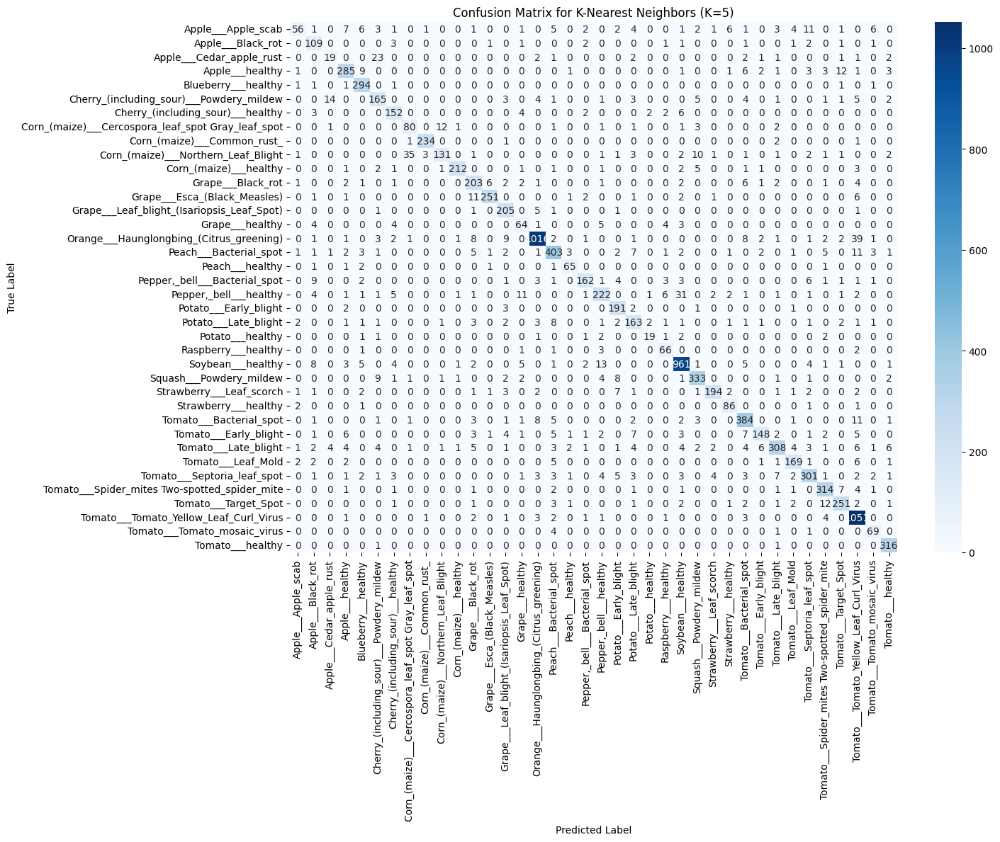

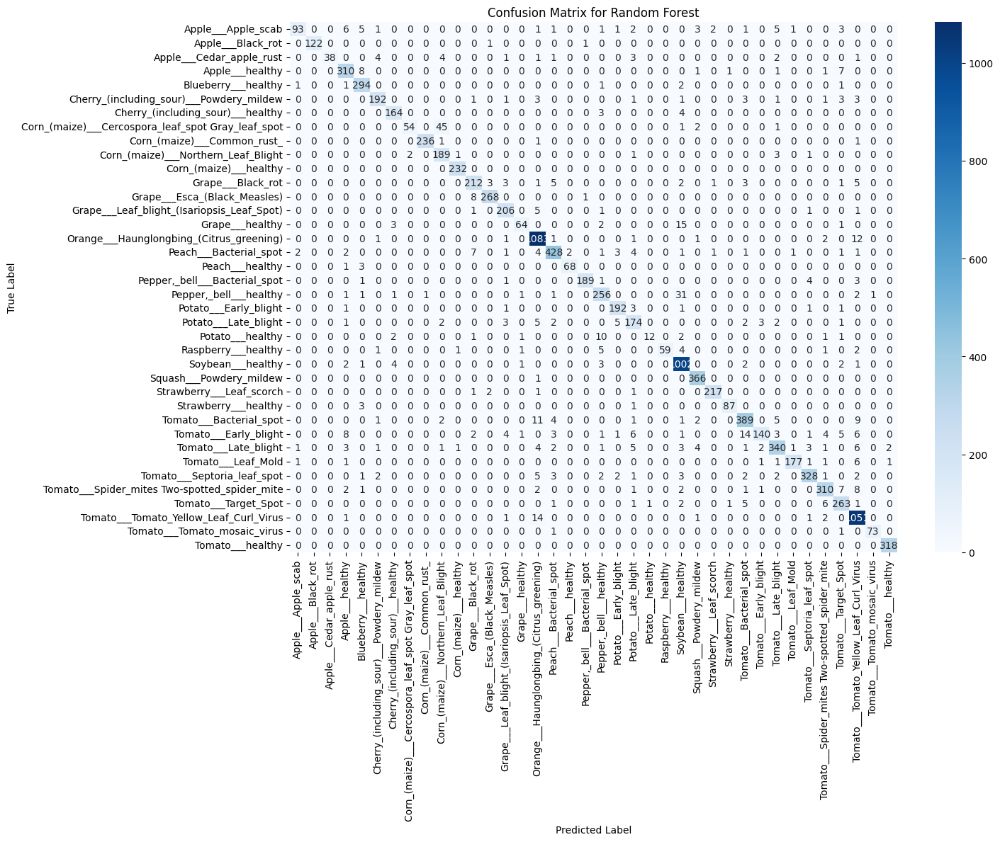

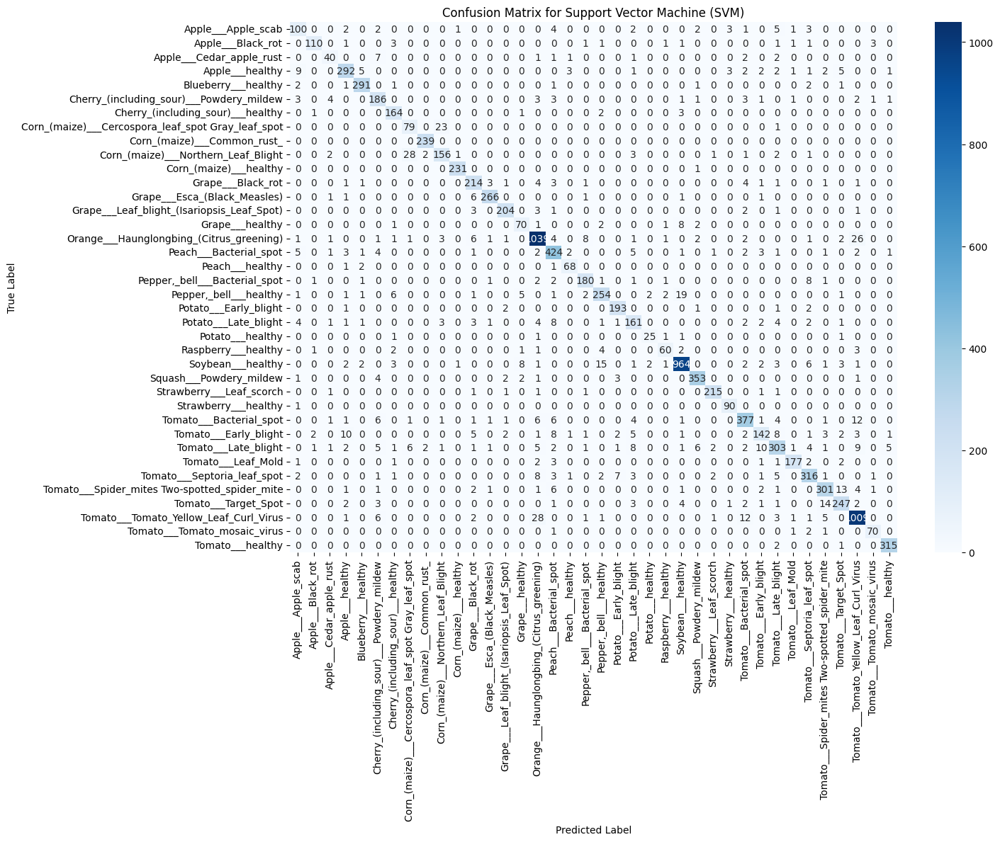

In [ ]:
for name, model_data in results.items():
    model = model_data['Model']
    y_pred = model.predict(X_test_scaled)

    # Generate confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Plot confusion matrix
    plt.figure(figsize=(15, 12))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

### **Displaying Sample Predictions**
This cell visualizes sample predictions for each trained model. It randomly selects 9 images from the test set, displays them, and shows the actual label versus the model's predicted label. Correct predictions are highlighted in green, and incorrect ones in red, providing an intuitive understanding of model behavior.


Displaying sample predictions for K-Nearest Neighbors (K=5):


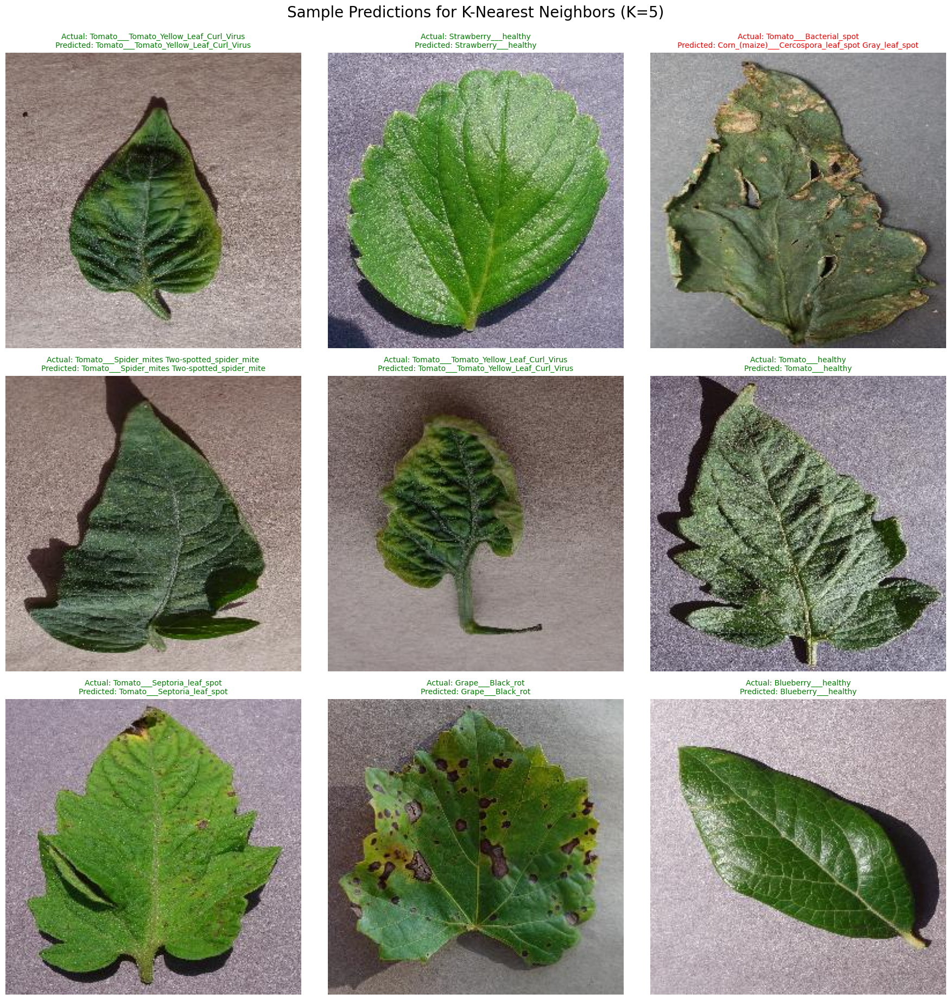


Displaying sample predictions for Random Forest:


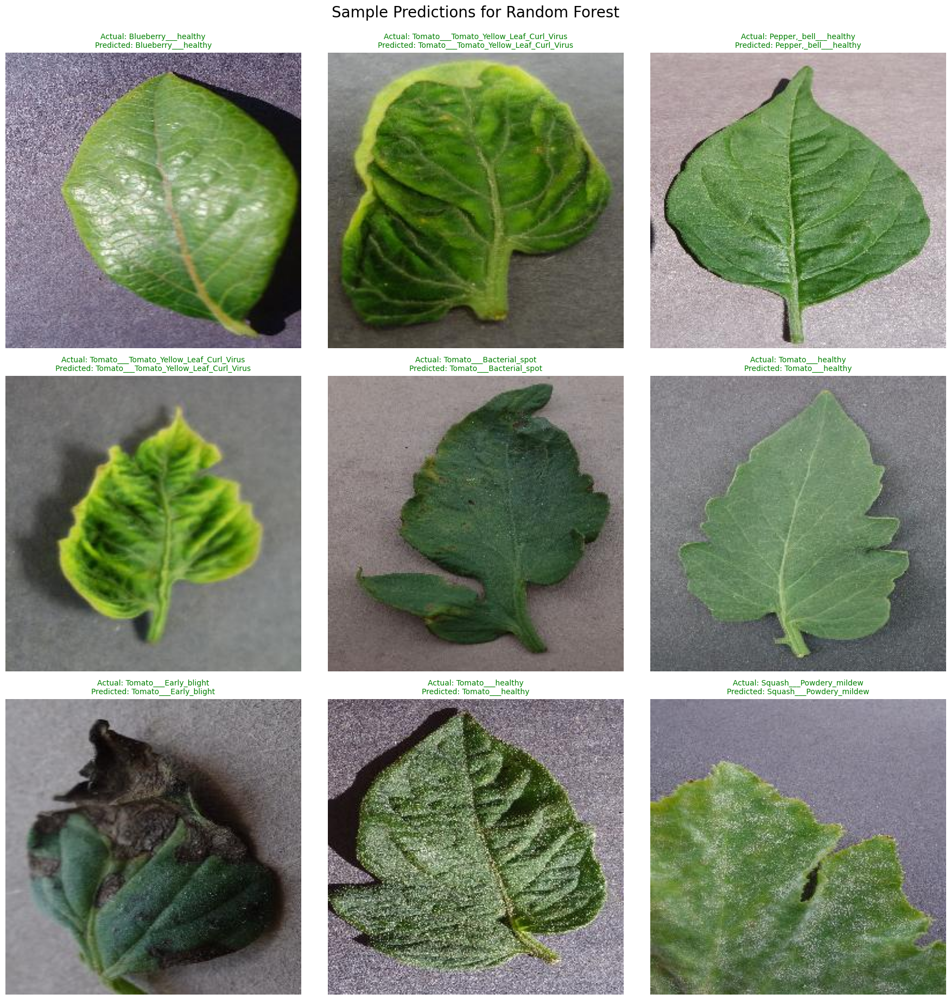


Displaying sample predictions for Support Vector Machine (SVM):


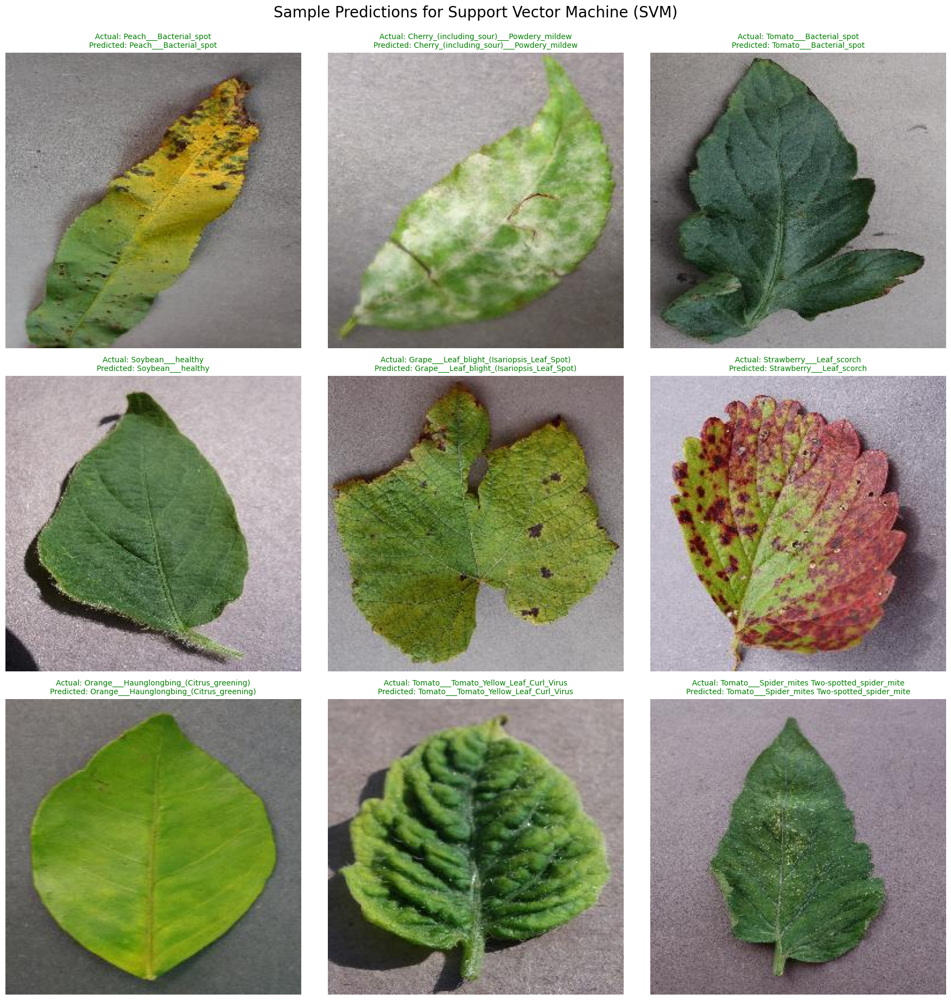

In [ ]:
num_samples_to_plot = 9 # Number of samples to plot for each model

for name, model_data in results.items():
    model = model_data['Model']
    print(f"\nDisplaying sample predictions for {name}:")

    plt.figure(figsize=(18, 18))

    # Get random indices for sampling from the test set
    random_indices = np.random.choice(len(test_df), num_samples_to_plot, replace=False)

    for i, rand_idx in enumerate(random_indices):
        plt.subplot(3, 3, i + 1)

        # Get original image path and true label from test_df
        img_path = test_df.iloc[rand_idx]['filepaths']
        true_label = y_test[rand_idx] # y_test contains string labels directly

        # Load and display the image
        img = plt.imread(img_path)
        plt.imshow(img)
        plt.axis('off')

        # Get scaled features for prediction
        scaled_features = X_test_scaled[rand_idx].reshape(1, -1) # Reshape for single prediction

        # Make prediction
        predicted_label = model.predict(scaled_features)[0]

        # Determine color for the title based on prediction correctness
        color = 'green' if true_label == predicted_label else 'red'
        plt.title(f"Actual: {true_label}\nPredicted: {predicted_label}", color=color, fontsize=10)

    plt.tight_layout()
    plt.suptitle(f'Sample Predictions for {name}', fontsize=20, y=1.02) # Add a title for the entire figure
    plt.show()
